In [1]:
import sys
sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages/lib/python/')
import ants
import os
import bigbadbrain as bbb
import numpy as np
import matplotlib.pyplot as plt
import time
import scipy
from scipy.ndimage.filters import gaussian_filter
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d

from skimage.filters import threshold_triangle
sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages')
import os
import statsmodels.api as sm
import cv2
import matplotlib.patches as mpatches
import psutil
from mpl_toolkits.axes_grid1 import ImageGrid
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
from matplotlib import colors

%matplotlib inline
plt.rcParams.update({'font.size': 20})

from sklearn.feature_extraction.image import grid_to_graph
from mpl_toolkits.axes_grid1 import ImageGrid
import json
from matplotlib.ticker import FuncFormatter

import nibabel as nib

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import fcluster
from scipy.cluster import hierarchy
import itertools
import random
import matplotlib as mpl
from matplotlib.pyplot import cm

from scipy.interpolate import UnivariateSpline
from sklearn.linear_model import LinearRegression
import matplotlib.patches as patches

from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV

from scipy.fftpack import fft,fftshift,ifft

In [2]:
n_clusters = 2000
labels_file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20201129_super_slices/cluster_labels.npy'
cluster_model_labels = np.load(labels_file)

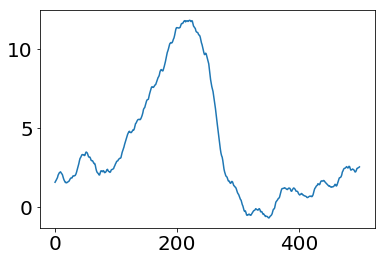

In [3]:
main_path = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20210316_neural_weighted_behavior"

response_files = [os.path.join(main_path, file) for file in os.listdir(main_path) if 'responses' in file]
bbb.sort_nicely(response_files)

responses = []
for file in response_files:
    responses.append(np.load(file))
responses = np.asarray(responses)
responses.shape

responses_split = np.reshape(responses, (49-18,2000,4,500))
responses_fft = fft(responses_split,axis=-1)
responses_fft[:,:,:,15:23] = 0
responses_fft[:,:,:,475:485] = 0
responses_filtered = ifft(responses_fft,axis=-1)
responses_filtered = responses_filtered.real
responses_filtered.shape

cluster_id = np.argmax(np.sum(responses_filtered[20,:,0,:].real, axis=1))
plt.plot(responses_filtered[20,cluster_id,0,:])

In [4]:
responses_filtered.shape #z,cluster,type,time

(31, 2000, 4, 500)

In [5]:
all_signals = np.reshape(responses_filtered[:,:,:,:],(31*2000,4,500))
all_maxs = np.max(np.abs(all_signals),axis=-1)
thresholds = np.percentile(all_maxs,75,axis=0)
to_delete = np.where(all_maxs[:,0]<thresholds[0])
thresholded_filters = np.delete(all_signals[:,0,:], to_delete, axis=0)
peaks = np.argmax(thresholded_filters,axis=-1)
idx_sort = np.argsort(peaks)

all_maxs = np.max(thresholded_filters,axis=-1)
thresholded_filters_norm = thresholded_filters/all_maxs[:,np.newaxis]

In [154]:
t0 = time.time()
print('clustering.........')
model = AgglomerativeClustering(distance_threshold=0,
                                n_clusters=None,
                                memory=main_path,
                                linkage='ward')
model = model.fit(thresholded_filters_norm)
print('complete!')
print(time.time()-t0)

clustering.........
complete!
0.20659613609313965


In [8]:
### Create linkage matrix for dendrogram

counts = np.zeros(model.children_.shape[0])
n_samples = len(model.labels_)
for i, merge in enumerate(model.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([model.children_, model.distances_,
                                  counts]).astype(float)

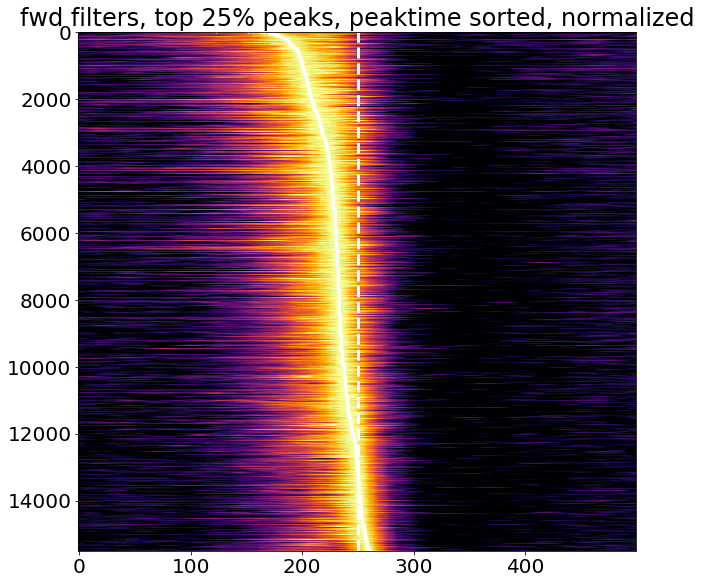

In [125]:
plt.figure(figsize=(10,10))
plt.imshow(thresholded_filters_norm[idx_sort,:],aspect=.03,cmap='inferno',vmin=0,vmax=1)
plt.axvline(250,linestyle='--',color='w',linewidth=3)
plt.plot(peaks[idx_sort],list(range(len(idx_sort))),marker='o',linestyle='',color='w',ms=1)
plt.title('fwd filters, top 25% peaks, peaktime sorted, normalized')

# plt.ylim(31000,30500)
# plt.xlim(100,300)

save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
plt.savefig(fname,dpi=300,bbox_inches='tight')

In [6]:
thresholded_filters.shape

(15500, 500)

In [103]:
ii = itertools.count(thresholded_filters_norm.shape[0])
nodes = [{'node_id': next(ii), 'left': x[0], 'right':x[1]} for x in model.children_]

In [104]:
n_colors = 20
master_cmap = 'jet'

n_samples = len(nodes) + 1
children_tracker = []

for i in range(len(nodes)):
    left_child = nodes[i]['left']
    right_child = nodes[i]['right']
    num_left_children = 0
    num_right_children = 0
    children_tracker.append({'children': [], 'engulfed_nodes': [i]})
        
    # LEFT CHILD
    if left_child < n_samples:
        children_tracker[-1]['children'].extend([left_child])
    else:
        index = left_child - n_samples
        children_tracker[-1]['children'].extend(children_tracker[index]['children'])
        num_left_children = len(children_tracker[index]['children'])
        
        children_tracker[-1]['engulfed_nodes'].extend(children_tracker[index]['engulfed_nodes'])
    
    # RIGHT CHILD
    if right_child < n_samples:
        children_tracker[-1]['children'].extend([right_child])
    else:
        index = right_child - n_samples
        children_tracker[-1]['children'].extend(children_tracker[index]['children'])
        num_right_children = len(children_tracker[index]['children'])
        
        children_tracker[-1]['engulfed_nodes'].extend(children_tracker[index]['engulfed_nodes'])
        
    # ASSIGN COLOR
    if right_child < n_samples and left_child < n_samples:
        children_tracker[-1]['color'] = random.randint(1, n_colors-1)
    else:
        if num_right_children > num_left_children:
            index = right_child - n_samples
            children_tracker[-1]['color'] = children_tracker[index]['color']
        else:
            index = left_child - n_samples
            children_tracker[-1]['color'] = children_tracker[index]['color']
            
# CREATE BRAIN COLORS OVER TIME

brain_colored = np.zeros((n_samples,n_samples))

for i in range(len(nodes)):
    brain_colored[i+1,:] = brain_colored[i,:]
    brain_colored[i+1,:][children_tracker[i]['children']] = children_tracker[i]['color']

In [238]:
brain_colored.shape

(15500, 15500)

In [ ]:
brain_colored_toplot = np.reshape(brain_colored, (9856,77,128))
brain_colored_toplot[brain_colored_toplot == 0] = 'nan'
print(brain_colored_toplot.shape)

In [105]:
# CREATE DENDROGRAM COLORS OVER TIME
# here, when a node gets a color, I want all of it's children to get that same color
# need a way to track which nodes were engulfed in other nodes

dendrogram_colored = np.zeros((n_samples,n_samples))

for i in range(len(nodes)):
    dendrogram_colored[i+1,:] = dendrogram_colored[i,:]
    dendrogram_colored[i+1,:][children_tracker[i]['engulfed_nodes']] = children_tracker[i]['color'] # give new node color
    
dendrogram_colored = dendrogram_colored.astype(int)
print(dendrogram_colored.shape)

(15500, 15500)


In [267]:
len(nodes)

15499

In [241]:
n_samples

15500

In [121]:
background_color = '#D3D3D3'
timepoint = 15460
n_colors = 50

cmap = cm.Greys(np.linspace(0, 1, n_samples))
throwaway_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in cmap]

cmap = getattr(cm, master_cmap)(np.linspace(0, 1, n_colors)) # make the n_colors possible colors in rgba
temp_colors = cmap[dendrogram_colored[timepoint,:],:] # index into these colors using cluster color_ids
true_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in temp_colors] # convert to hex

colors = throwaway_colors + true_colors # add throwaway colors to frontend
colors[n_samples+timepoint:] = [background_color]*(n_samples-timepoint) # add grey to non-clusted samples

In [120]:
np.unique(dendrogram_colored[15460,:])

array([ 0,  1,  2,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 15, 16, 17, 18,
       19])

In [112]:
n_samples

15500

In [27]:
cluster_ids = fcluster(linkage_matrix, t=10, criterion='maxclust')

In [29]:
np.unique(cluster_ids)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int32)

In [255]:
len(colors)

31000

In [80]:
colors = ['k']*30999
#colors[:30000] = ['r']*30000
colors[-3:] = ['r']*3

In [58]:
colors[:10] = 'k'

In [60]:
len(colors)

30982

In [65]:
linkage_matrix.shape

(15499, 4)

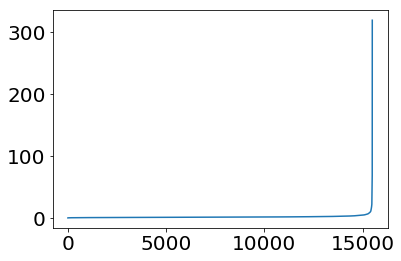

In [156]:
plt.plot(model.distances_)

In [144]:
dir(model)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_estimator_type',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 'affinity',
 'children_',
 'compute_full_tree',
 'connectivity',
 'distance_threshold',
 'fit',
 'fit_predict',
 'get_params',
 'labels_',
 'linkage',
 'memory',
 'n_clusters',
 'n_clusters_',
 'n_components_',
 'n_connected_components_',
 'n_leaves_',
 'set_params']

In [163]:
thresh

0.5212039831296025

In [185]:
### Given a desired # of clusters, grab the distance threshold - needed for dendrogram
n_clusters = 10
thresh = model.distances_[-n_clusters+1]

### Create the same # of colors as # of clusters
custom_cmap = cm.jet(np.linspace(0, 1, n_clusters))
cluster_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in custom_cmap]
hierarchy.set_link_color_palette(cluster_colors)

### Grab the cluster ids
cluster_ids = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

In [197]:
custom_cmap

array([[0.        , 0.        , 0.5       , 1.        ],
       [0.        , 0.        , 0.99910873, 1.        ],
       [0.        , 0.37843137, 1.        , 1.        ],
       [0.        , 0.83333333, 1.        , 1.        ],
       [0.30044276, 1.        , 0.66729918, 1.        ],
       [0.66729918, 1.        , 0.30044276, 1.        ],
       [1.        , 0.90123457, 0.        , 1.        ],
       [1.        , 0.48002905, 0.        , 1.        ],
       [0.99910873, 0.07334786, 0.        , 1.        ],
       [0.5       , 0.        , 0.        , 1.        ]])

In [198]:
cluster_ids[]

array([4, 9, 6, ..., 6, 7, 7], dtype=int32)

In [192]:
cluster_colors

['#000080',
 '#0000ff',
 '#0060ff',
 '#00d4ff',
 '#4dffaa',
 '#aaff4d',
 '#ffe600',
 '#ff7a00',
 '#ff1300',
 '#800000']

In [191]:
custom_cmap

array([[0.        , 0.        , 0.5       , 1.        ],
       [0.        , 0.        , 0.99910873, 1.        ],
       [0.        , 0.37843137, 1.        , 1.        ],
       [0.        , 0.83333333, 1.        , 1.        ],
       [0.30044276, 1.        , 0.66729918, 1.        ],
       [0.66729918, 1.        , 0.30044276, 1.        ],
       [1.        , 0.90123457, 0.        , 1.        ],
       [1.        , 0.48002905, 0.        , 1.        ],
       [0.99910873, 0.07334786, 0.        , 1.        ],
       [0.5       , 0.        , 0.        , 1.        ]])

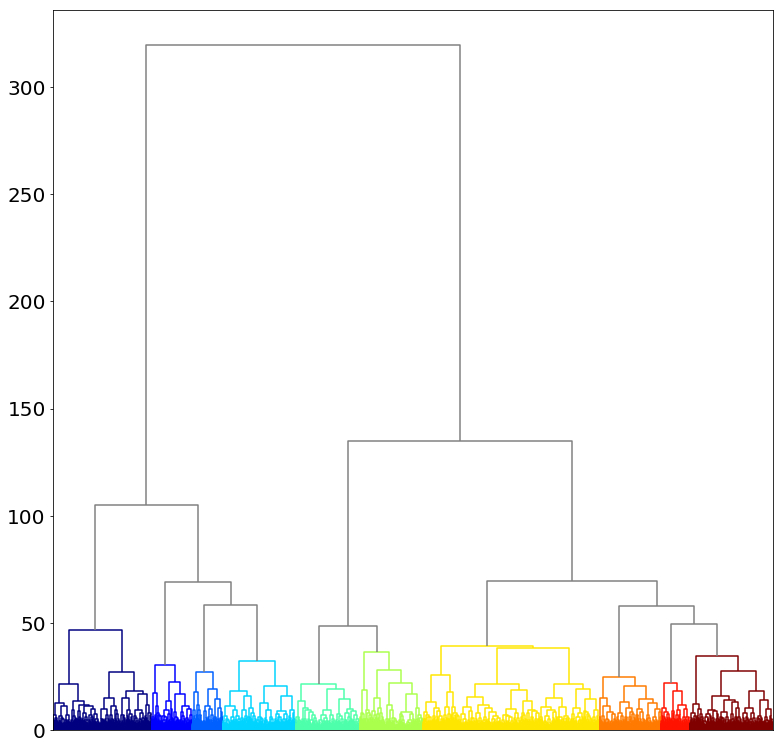

In [184]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1.1, 0, 1, 1])
#ax_dendrogram.get_xaxis().set_visible(False)
#ax_dendrogram.get_yaxis().set_visible(False)
dend = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=0,
           color_threshold=thresh,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
           above_threshold_color='grey');

In [151]:
linkage_matrix[]

array([[8.02400000e+03, 8.55100000e+03, 4.57372097e-01, 2.00000000e+00],
       [8.80400000e+03, 9.30700000e+03, 4.67574405e-01, 2.00000000e+00],
       [1.09690000e+04, 1.16000000e+04, 4.92919307e-01, 2.00000000e+00],
       ...,
       [3.09890000e+04, 3.09940000e+04, 1.04976747e+02, 5.23500000e+03],
       [3.09900000e+04, 3.09950000e+04, 1.34900789e+02, 1.02650000e+04],
       [3.09960000e+04, 3.09970000e+04, 3.19632059e+02, 1.55000000e+04]])

In [ ]:
dend

In [131]:
dend.keys()

dict_keys(['icoord', 'dcoord', 'ivl', 'leaves', 'color_list'])

In [129]:
dend['leaves_color_list']

KeyError: 'leaves_color_list'

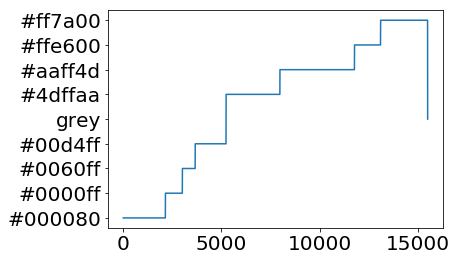

In [133]:
plt.plot(dend['color_list'])

In [132]:
np.unique(dend['color_list'])

array(['#000080', '#0000ff', '#0060ff', '#00d4ff', '#4dffaa', '#aaff4d',
       '#ff7a00', '#ffe600', 'grey'], dtype='<U7')

In [128]:
len(dend['color_list'])

15499

In [236]:
fig = plt.figure(figsize=(10,10))
background_color = '#D3D3D3'

timepoint = 9800

ax_brain = fig.add_axes([0, 0, 1, 1])
ax_brain.imshow(brain_colored_toplot[timepoint,:,:],vmin=0,vmax=n_colors,cmap=master_cmap)
ax_brain.get_xaxis().set_visible(False)
ax_brain.get_yaxis().set_visible(False)
ax_brain.set_facecolor(background_color)

plt.text(0,-20,'num_clusters: {}'.format(n_samples-timepoint), fontsize=30)
plt.text(0,100,'{}\nfly_5\nslice_8 (PB)\nlinkage: ward_cc'.format(time.strftime("%Y%m%d")),fontsize=20)


cmap = cm.Greys(np.linspace(0, 1, n_samples))
throwaway_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in cmap]

cmap = getattr(cm, master_cmap)(np.linspace(0, 1, n_colors)) # make the n_colors possible colors in rgba
temp_colors = cmap[dendrogram_colored[timepoint,:],:] # index into these colors using cluster color_ids
true_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in temp_colors] # convert to hex

colors = throwaway_colors + true_colors # add throwaway colors to frontend
colors[n_samples+timepoint:] = [background_color]*(n_samples-timepoint) # add grey to non-clusted samples

ax_dendrogram = fig.add_axes([1.1, 0, 1, 1])
ax_dendrogram.get_xaxis().set_visible(False)
ax_dendrogram.get_yaxis().set_visible(False)
dendrogram(linkage_matrix,
           truncate_mode=None,
           p=10000,
           color_threshold=None,
           link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True);
try:
    plt.axhline(linkage_matrix[timepoint,2],color='k',linestyle='--')
except:
    print('axhline failed')
    

ax_dend_hist = fig.add_axes([2, 0, .3, 1],sharey=ax_dendrogram)
ax_dend_hist.hist(linkage_matrix[:,2],bins=100,orientation='horizontal',color=background_color);
try:
    ax_dend_hist.axhline(linkage_matrix[timepoint,2],color='k',linestyle='--')
except:
    print('axhline failed')
ax_dend_hist.get_xaxis().set_visible(False)
ax_dend_hist.get_yaxis().set_visible(False)

15500

In [137]:
len(dend['leaves'])

15500

In [ ]:
### dend['leaves'] gives the reorder indicies from the original sample vector to the sorted dendrogram

### cmap = cm.jet(np.linspace(0, 1, 10))
### hierarchy.set_link_color_palette([mpl.colors.rgb2hex(rgb[:3]) for rgb in cmap])

### i can get cluster ids from fcluster or agglom model

###

In [228]:
master_cmap = 'jet'
n_colors = 8
cmap = getattr(cm, master_cmap)(np.linspace(0, 1, n_colors)) # make the n_colors possible colors in rgba
#temp_colors = cmap[dendrogram_colored[timepoint,:],:] # index into these colors using cluster color_ids
#true_colors = [mpl.colors.rgb2hex(rgb[:3]) for rgb in temp_colors] # convert to hex

In [229]:
cmap

array([[0.        , 0.        , 0.5       , 1.        ],
       [0.        , 0.06470588, 1.        , 1.        ],
       [0.        , 0.64509804, 1.        , 1.        ],
       [0.24984187, 1.        , 0.71790006, 1.        ],
       [0.71790006, 1.        , 0.24984187, 1.        ],
       [1.        , 0.72694263, 0.        , 1.        ],
       [1.        , 0.18954248, 0.        , 1.        ],
       [0.5       , 0.        , 0.        , 1.        ]])

In [199]:
cluster_ids[dend['leaves'][::-1]]

array([10, 10, 10, ...,  1,  1,  1], dtype=int32)

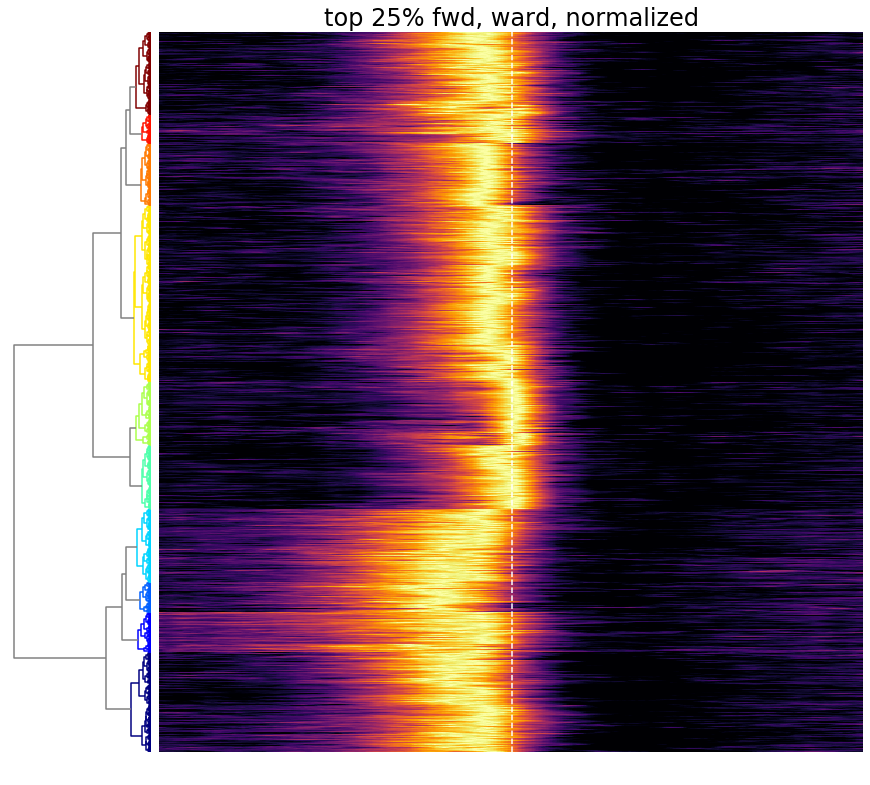

In [196]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1, 1, .2, 1])
ax_dendrogram.axis('off')
dend = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=0,
           color_threshold=thresh,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
           above_threshold_color='grey',
           orientation='left');

ax = fig.add_axes([1.2, 1, 1, 1])
ax.imshow(thresholded_filters_norm[dend['leaves'][::-1],:],vmin=0,vmax=1,aspect=0.033,cmap='inferno')
ax.axis('off')
for line in [250]:
    ax.axvline(line,color='w',linestyle='--')    
plt.title('top 25% fwd, ward, normalized')

#ax_dend_hist = fig.add_axes([2, 0, .3, 1],sharey=ax_dendrogram)

save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
#plt.savefig(fname,dpi=300,bbox_inches='tight')

In [227]:
np.unique(test['color_list'])

array(['c', 'g', 'grey', 'k', 'm', 'r', 'y'], dtype='<U4')

In [140]:
t0 = time.time()
print('clustering.........')
model = AgglomerativeClustering(distance_threshold=None,
                                n_clusters=10,
                                memory=main_path,
                                linkage='ward')
model = model.fit(thresholded_filters_norm)
print('complete!')
print(time.time()-t0)

clustering.........
complete!
6.781457424163818


In [21]:
cluster_ids = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')

In [134]:
cluster_ids

array([4, 9, 6, ..., 6, 7, 7], dtype=int32)

In [216]:
cluster_colors.insert(0,'grey')
cmap = colors.ListedColormap(cluster_colors)

In [217]:
add_deleted_voxels = np.zeros(62000)
to_replace = [i for i in range(62000) if i not in to_delete[0]]
add_deleted_voxels[to_replace] = cluster_ids #model.labels_ ### put signal here
to_plot = np.reshape(add_deleted_voxels, (31,2000))

In [218]:
# now lets look at the brain with these clusters

all_colored_by_betas = []
for z in range(9,49-9):
    colored_by_betas = np.zeros(256*128)
    for cluster_num in range(len(np.unique(cluster_model_labels[z]))):
        cluster_indicies = np.where(cluster_model_labels[z]==cluster_num)[0]
        colored_by_betas[cluster_indicies] = to_plot[z-9,cluster_num]
    colored_by_betas = colored_by_betas.reshape(256,128)
    all_colored_by_betas.append(colored_by_betas)
all_colored_by_betas = np.asarray(all_colored_by_betas)
# to_plot = np.max(all_colored_by_betas, axis=0)
# plt.imshow(to_plot[:,:].T)
#all_colored_by_betas[all_colored_by_betas==0] = np.nan

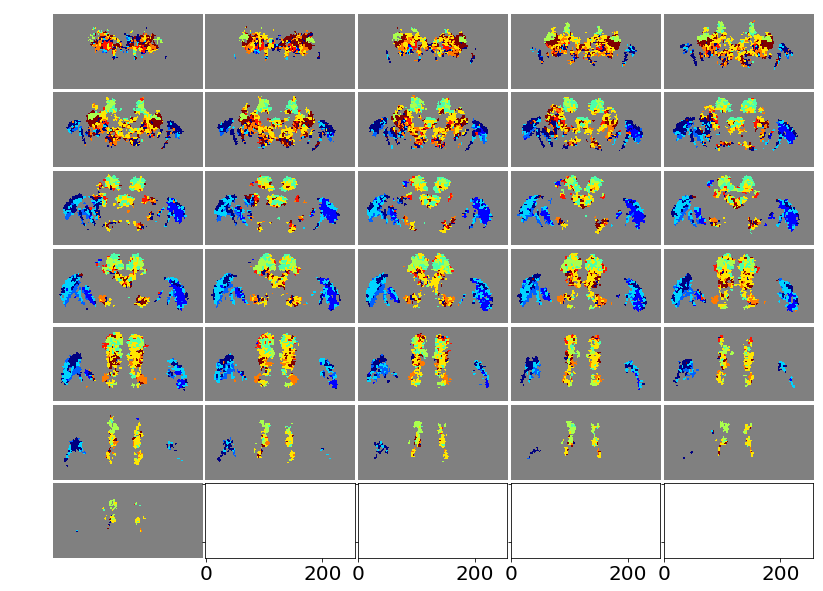

In [219]:
fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(7, 5), axes_pad=.05)
for i in range(31):
    cax = grid[i].imshow(all_colored_by_betas[i,:,:].T,cmap=cmap);
    grid[i].axis('off')

#cbar = fig.colorbar(cax, ticks=[start, middle, end],shrink=.4, anchor=(1.3,.5))
#cbar.ax.set_yticklabels(['-300ms', '0', '+600ms'], fontsize=12)
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
#plt.savefig(fname,dpi=300,bbox_inches='tight')#

(0, 25)

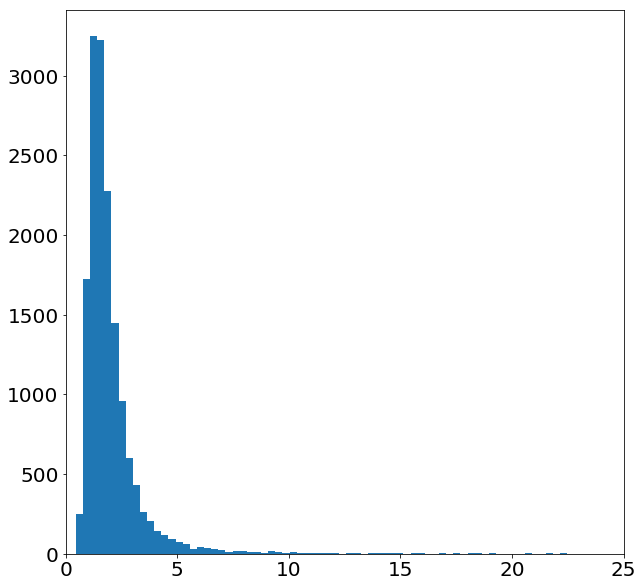

In [133]:
plt.figure(figsize=(10,10))
plt.hist(linkage_matrix[:,2],bins=1000);
plt.xlim(0,25)

In [108]:
linkage_matrix.shape

(15499, 4)

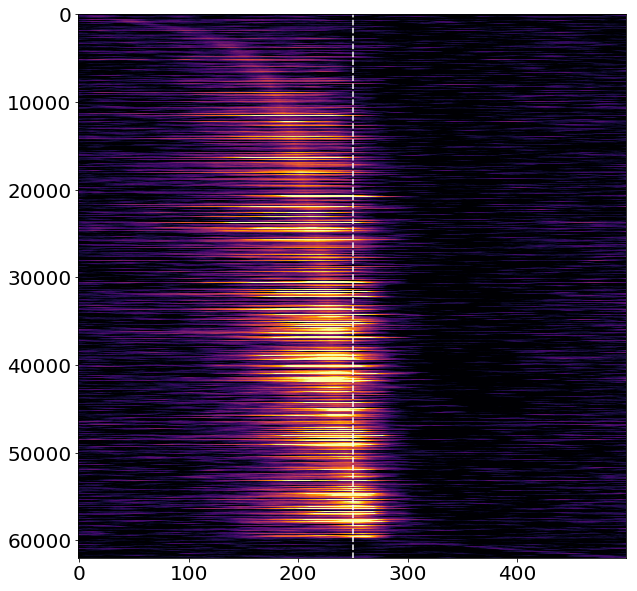

In [26]:
plt.figure(figsize=(10,10))
plt.imshow(all_signals[idx_sort,0,:],aspect=.008,cmap='inferno',vmin=0,vmax=8)
plt.axvline(250,linestyle='--',color='w')


In [20]:
test

array([ 6210, 10198, 11493, ..., 56992, 16990, 44390])

In [16]:
test = sorted(list(peaks))

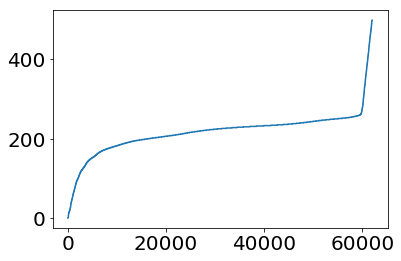

In [18]:
plt.plot(test)

In [44]:
all_signals = np.reshape(responses_filtered[:,:,:,:],(31*2000,4,500))
# (62000,4,500)
# want to exclude signals that have no response to any behavior
# each behavior type will have a different distribution of sum(abs(signal))
all_sums = np.sum(np.abs(all_signals),axis=-1)
all_maxs = np.max(np.abs(all_signals),axis=-1)

# (62000,4)
# how to pick the threshold for each behavior?
# lets aim to use corr map sig threshold,
# but for now take top 25%
thresholds = np.percentile(all_maxs,75,axis=0)
all_signals[(all_sums<thresholds[np.newaxis,:])] = 0


all_signals_normalized = all_signals/all_maxs[:,:,np.newaxis]
all_signals_normalized = np.nan_to_num(all_signals_normalized)

to_fit = np.reshape(all_signals_normalized, (62000,2000))

# now let's simply exclude voxels that are zero for all behaviors
idx2rmv = np.where(np.sum(to_fit,axis=-1)==0)[0] #this gives indicies of voxels to remove
to_fit = np.delete(to_fit, idx2rmv,axis=0)

In [25]:
all_signals = np.reshape(responses_filtered[:,:,:,:],(31*2000,4,500))
all_maxs = np.max(np.abs(all_signals),axis=-1)
all_signals_normalized = all_signals/all_maxs[:,:,np.newaxis]
all_signals_normalized = np.nan_to_num(all_signals_normalized)

all_signals_normalized.shape

(62000, 4, 500)

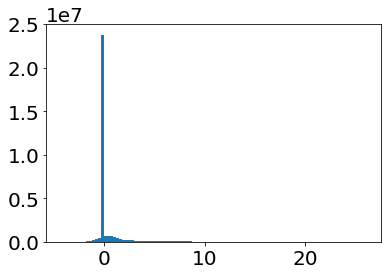

In [102]:
plt.hist(all_signals[:,0,:].flatten(),bins=100);

In [125]:
len(np.where(np.sum(all_signals[:,0,:],axis=-1)==0)[0])

46500

In [5]:
all_signals = np.reshape(responses_filtered[:,:,:,:],(31*2000,4,500))

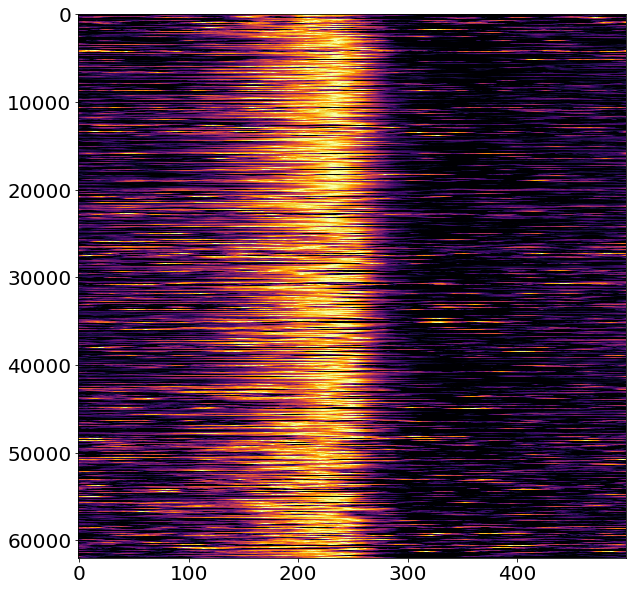

In [27]:
plt.figure(figsize=(10,10))
plt.imshow(all_signals_normalized[:,0,:],aspect=.008,cmap='inferno',vmin=0,vmax=1)

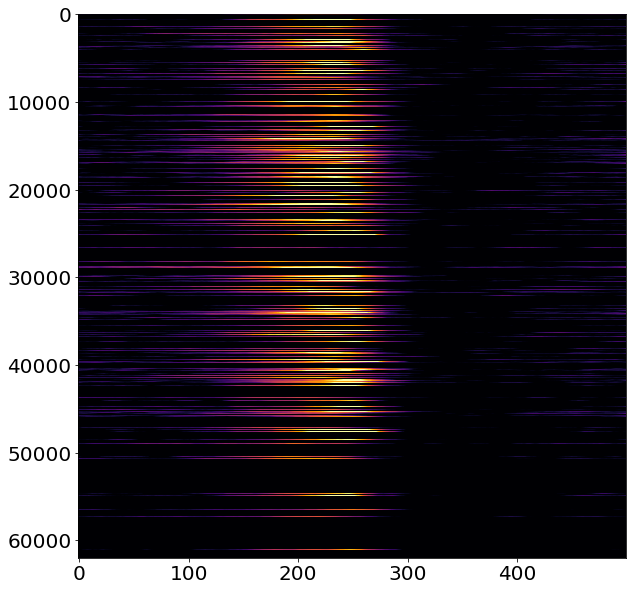

In [123]:
plt.figure(figsize=(10,10))
plt.imshow(all_signals[:,0,:],aspect=.008,cmap='inferno',vmin=0,vmax=10)

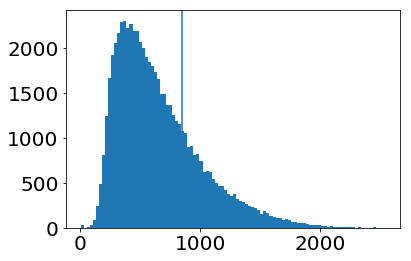

In [10]:
plt.hist(all_sums[:,0],bins=100);
plt.axvline(850)

In [106]:
all_signals[:,0,:].shape

(62000, 500)

In [45]:
to_fit.shape

(20800, 2000)

In [46]:
t0 = time.time()
print('clustering.........')
model = AgglomerativeClustering(distance_threshold=0,
                                n_clusters=None,
                                memory=main_path,
                                linkage='ward')
model = model.fit(to_fit)
print('complete!')
print(time.time()-t0)

clustering.........
complete!
428.8228678703308


In [28]:
t0 = time.time()
print('clustering.........')
model = AgglomerativeClustering(distance_threshold=0,
                                n_clusters=None,
                                memory=main_path,
                                linkage='ward')
model = model.fit(all_signals_normalized[:,0,:])
print('complete!')
print(time.time()-t0)

clustering.........
complete!
1163.1557483673096


In [8]:
1

1

In [161]:
# peak_max = np.max(all_z,axis=-1)
# peak_time = np.argmax(all_z,axis=-1)
peaks = np.argmax(responses_filtered[4,:500,0,:],axis=-1)
peaks.shape

(500,)

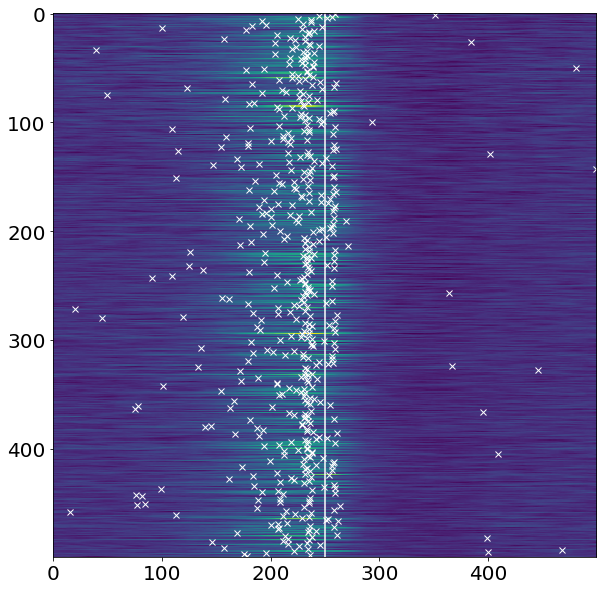

In [171]:
plt.figure(figsize=(20,10))
plt.imshow(responses_filtered[4,:500,0,:])
plt.axvline(250,c='w')
plt.plot(peaks,list(range(500)),marker='x',linestyle='',color='w')

(100, 300)

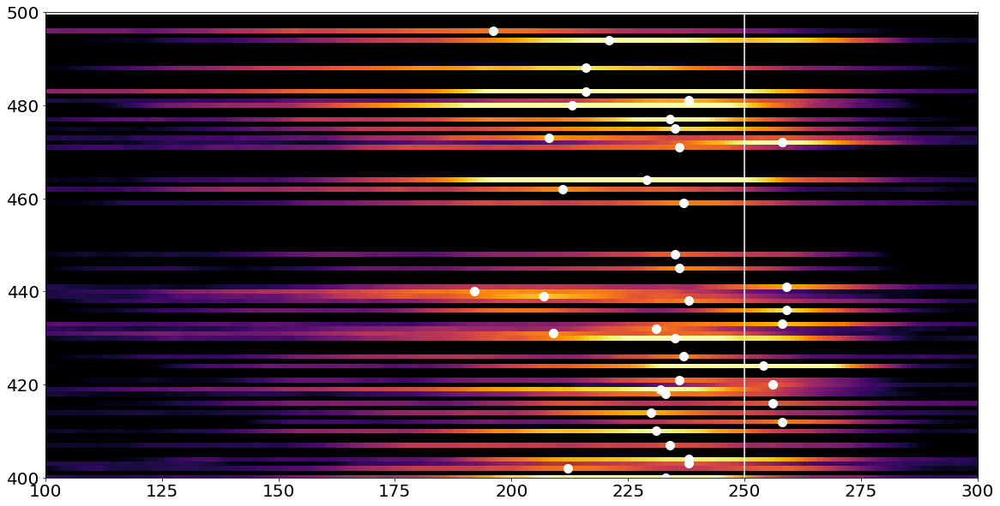

In [223]:
peak_time = np.argmax(responses_filtered[4,:500,0,:],axis=-1)
peaks = np.max(responses_filtered[4,:500,0,:],axis=-1)

plt.figure(figsize=(20,10))
thresh = 6

plt.imshow((responses_filtered[4,:500,0,:].T*(peaks>thresh)).T,vmax=10,vmin=0,cmap='inferno')
plt.axvline(250,c='w')
plt.plot(peak_time*(peaks>thresh),list(range(500)),marker='o',linestyle='',color='w',ms=10)
plt.ylim(400,500)
plt.xlim(100,300)

In [6]:
# lets try subtracting walking filter from forward filter
# first normalize
peak_max = np.max(responses_filtered,axis=-1)
print(peak_max.shape)

responses_normalized = responses_filtered/peak_max[:,:,:,np.newaxis]
print(responses_normalized.shape)

fwd_sub_walk = responses_normalized[:,:,0,:] - responses_normalized[:,:,3,:]
print(fwd_sub_walk.shape)

(31, 2000, 4)
(31, 2000, 4, 500)
(31, 2000, 500)


In [29]:
### Create linkage matrix for dendrogram

counts = np.zeros(model.children_.shape[0])
n_samples = len(model.labels_)
for i, merge in enumerate(model.children_):
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1  # leaf node
        else:
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([model.children_, model.distances_,
                                  counts]).astype(float)

In [118]:
linkage_matrix.shape

(61999, 4)

In [119]:
sys.setrecursionlimit(10000)

In [10]:
test = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=10,
           color_threshold=None,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
           no_plot=True);

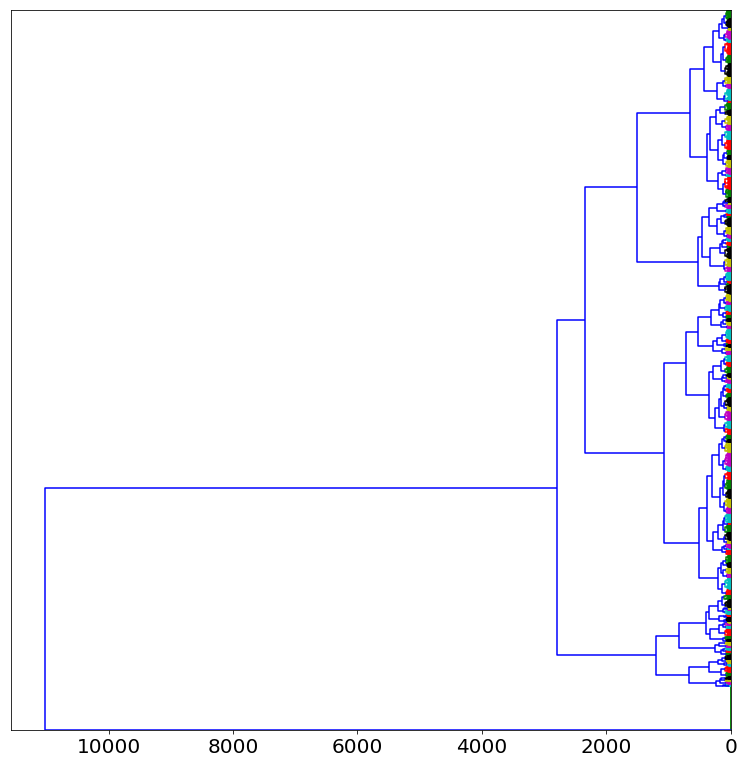

In [122]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1, 1, 1, 1])
#ax_dendrogram.get_xaxis().set_visible(False)
#ax_dendrogram.get_yaxis().set_visible(False)
test = dendrogram(linkage_matrix,
           truncate_mode='level',
           p=1000,
           color_threshold=100,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
            orientation='left');

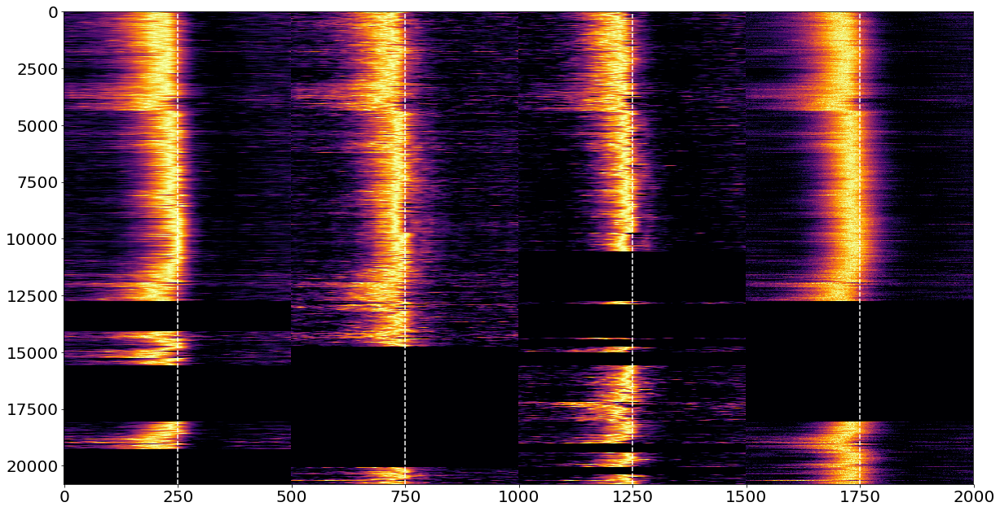

In [68]:
plt.figure(figsize=(20,20))
plt.imshow(to_fit[dendro['leaves'],:],vmin=0,vmax=1,aspect=0.05,cmap='inferno')
for line in [250,750,1250,1750]:
    plt.axvline(line,color='w',linestyle='--')

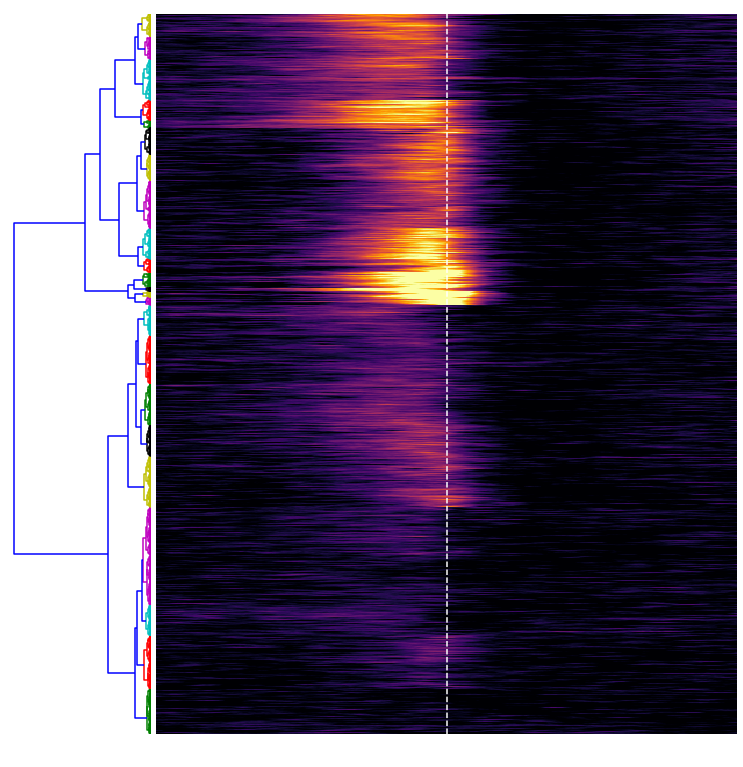

In [24]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1, 1, .2, 1])
ax_dendrogram.axis('off')
dendro = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=6,
           color_threshold=500,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
            orientation='left');

ax = fig.add_axes([1.11, 1, 1, 1])
ax.imshow(all_signals[:,0,:][dendro['leaves'][::-1],:],vmin=0,vmax=10,aspect=0.01,cmap='inferno')
ax.axis('off')
for line in [250]:
    ax.axvline(line,color='w',linestyle='--')
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
#plt.savefig(fname,dpi=300,bbox_inches='tight')

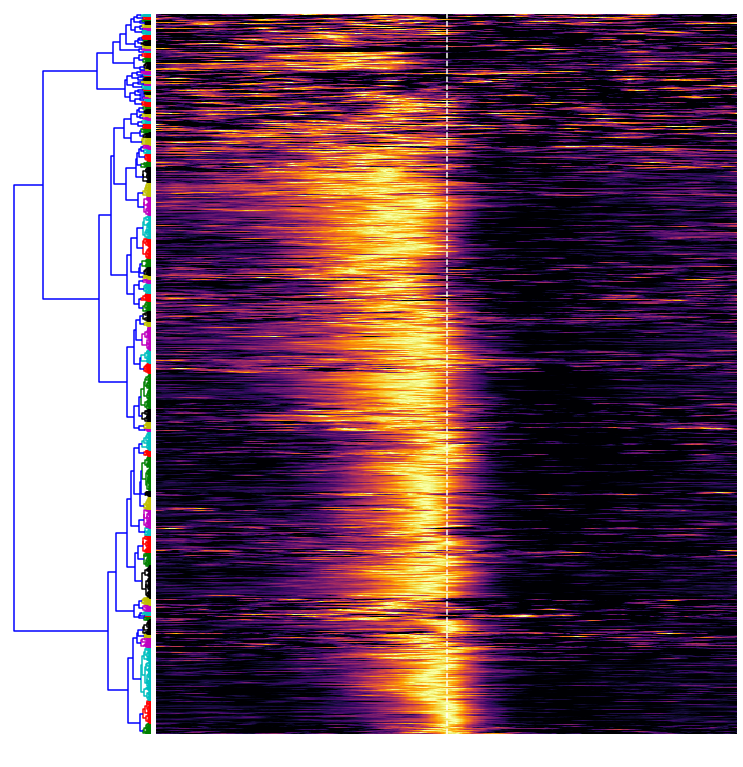

In [38]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1, 1, .2, 1])
ax_dendrogram.axis('off')
dendro = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=6,
           color_threshold=50,
           #link_color_func=lambda x: colors[x],
           no_labels=True,
           distance_sort=True,
            orientation='left');

ax = fig.add_axes([1.11, 1, 1, 1])
ax.imshow(all_signals_normalized[:,0,:][dendro['leaves'][::-1],:],vmin=0,vmax=1,aspect=0.01,cmap='inferno')
ax.axis('off')
for line in [250]:
    ax.axvline(line,color='w',linestyle='--')
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
plt.savefig(fname,dpi=300,bbox_inches='tight')

RecursionError: maximum recursion depth exceeded while getting the str of an object

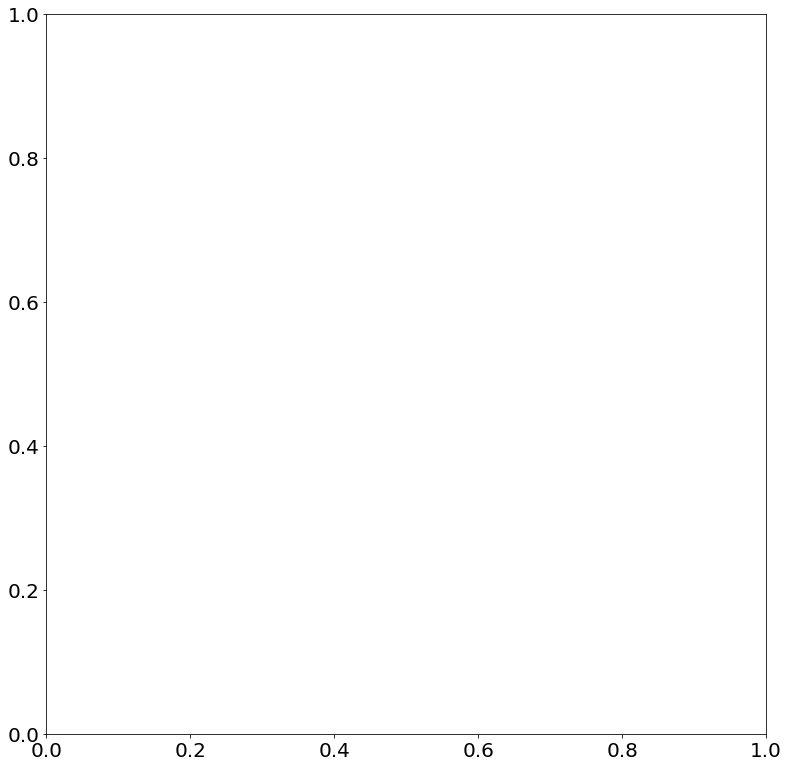

In [26]:
fig = plt.figure(figsize=(10,10))

ax_dendrogram = fig.add_axes([1, 1, 1, 1])
#ax_dendrogram.get_xaxis().set_visible(False)
#ax_dendrogram.get_yaxis().set_visible(False)
test = dendrogram(linkage_matrix,
           truncate_mode=None,
           p=5,
           #color_threshold=250,
           #link_color_func=lambda x: colors[x],
           no_labels=True)
           #distance_sort=False);

In [19]:
to_fit.shape

(62000, 2000)

In [ ]:
test['leaves']

In [9]:
plt.figure(figsize=(20,20))
plt.imshow(to_fit[test['leaves'],:][50000:,:],cmap='seismic',vmin=-20,vmax=20,aspect=.03)
plt.axvline(250,color='k',linestyle='--')
plt.axvline(750,color='k',linestyle='--')
plt.axvline(1250,color='k',linestyle='--')


#plt.axhline(250,color='k',linestyle='--')
#plt.xlim(0,500)

IndexError: index 115172 is out of bounds for axis 0 with size 62000

<Figure size 1440x1440 with 0 Axes>

In [22]:
len(test['leaves'])

60

In [13]:
to_fit[test['leaves'],:]

IndexError: index 115172 is out of bounds for axis 0 with size 62000

In [190]:
responses_filtered[4,:500,0,:].shape

(500, 500)

In [191]:
peaks.shape

(500,)

(100, 300)

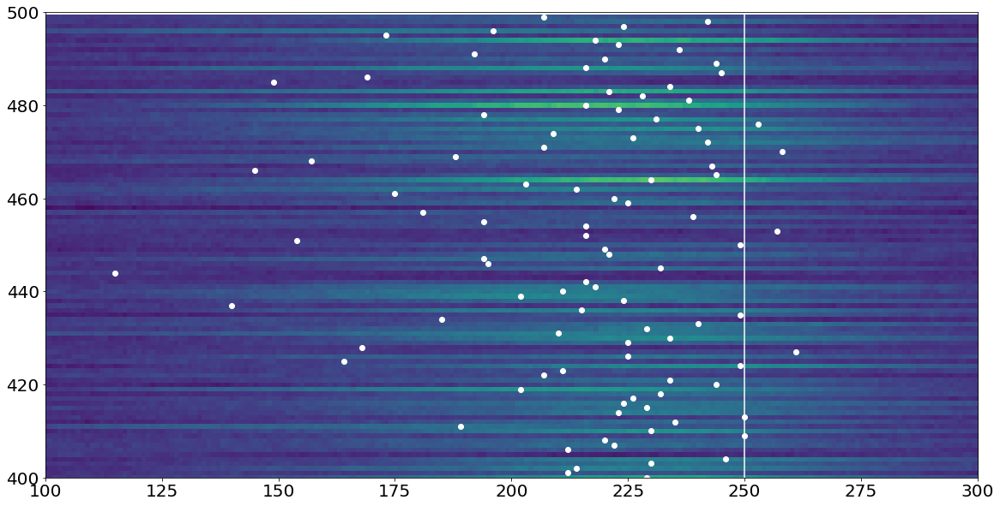

In [176]:
peaks = np.argmax(responses_filtered[4,:500,3,:],axis=-1)

plt.figure(figsize=(20,10))
plt.imshow(responses_filtered[4,:500,3,:])
plt.axvline(250,c='w')
plt.plot(peaks,list(range(500)),marker='o',linestyle='',color='w')
plt.ylim(400,500)
plt.xlim(100,300)

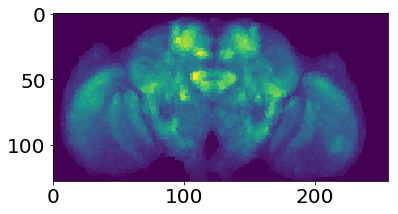

In [143]:
all_colored_by_betas = []
for z in range(9,49-9):
    colored_by_betas = np.zeros(256*128)
    for cluster_num in range(len(np.unique(cluster_model_labels[z]))):
        cluster_indicies = np.where(cluster_model_labels[z]==cluster_num)[0]
        colored_by_betas[cluster_indicies] = peak_max[z-9,cluster_num,0]
    colored_by_betas = colored_by_betas.reshape(256,128)
    all_colored_by_betas.append(colored_by_betas)
all_colored_by_betas = np.asarray(all_colored_by_betas)
to_plot = np.max(all_colored_by_betas, axis=0)
plt.imshow(to_plot[:,:].T)

fwd_max = all_colored_by_betas.copy()
fwd_max = np.swapaxes(fwd_max,1,2)

In [128]:
all_colored_by_betas.shape

(31, 256, 128)

In [144]:
all_z = []
for j, z in enumerate(range(9,49-9)):
    colored_by_betas = np.zeros((256*128,500))
    for cluster_num in range(n_clusters):
        cluster_indicies = np.where(cluster_model_labels[z,:]==cluster_num)[0]
        colored_by_betas[cluster_indicies,:] = fwd_sub_walk[j,cluster_num,:] #responses_filtered[j,cluster_num,:]
    colored_by_betas = colored_by_betas.reshape(256,128,500)
    all_z.append(colored_by_betas)
all_z = np.asarray(all_z)

all_z = np.swapaxes(all_z,1,2)
all_z.shape

(31, 128, 256, 500)

In [145]:
peak_max = np.max(all_z,axis=-1)
peak_time = np.argmax(all_z,axis=-1)

In [146]:
peak_time[np.where(fwd_max<6)] = 0

In [134]:
peak_time.shape

(31, 128, 256)

In [133]:
fwd_max.shape

(31, 256, 128)

In [153]:
start = 265
end = 190#220
middle = 250

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.Blues_r(np.linspace(0., 1, middle-end))
colors2 = plt.cm.Reds(np.linspace(0, 1, start-middle))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

mymap.set_bad(color='black')

In [154]:
peak_time = np.ndarray.astype(peak_time,'float')
peak_time[np.where(peak_time==0)] = np.nan

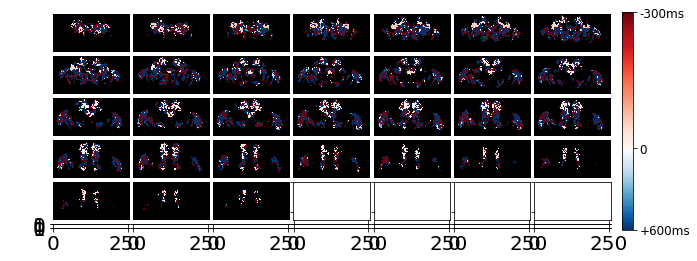

In [156]:
fig = plt.figure(figsize=(10,10))
grid = ImageGrid(fig, 111, nrows_ncols=(7, 7), axes_pad=.05)
for i in range(31):
    cax = grid[i].imshow(peak_time[i,:,:],cmap=mymap,vmin=end,vmax=start);
    grid[i].axis('off')

cbar = fig.colorbar(cax, ticks=[start, middle, end],shrink=.4, anchor=(1.3,.5))
cbar.ax.set_yticklabels(['-300ms', '0', '+600ms'], fontsize=12)
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
#plt.savefig(fname,dpi=300,bbox_inches='tight')#

In [116]:
#responses_filtered = np.reshape(responses_filtered,(49-18,2000,2000))

all_z = []
for j, z in enumerate(range(9,49-9)):
    colored_by_betas = np.zeros((256*128,2000))
    for cluster_num in range(n_clusters):
        cluster_indicies = np.where(cluster_model_labels[z,:]==cluster_num)[0]
        colored_by_betas[cluster_indicies,:] = responses_filtered[j,cluster_num,:]
    colored_by_betas = colored_by_betas.reshape(256,128,2000)
    all_z.append(colored_by_betas)
all_z = np.asarray(all_z)

all_z = np.swapaxes(all_z,1,2)
all_z.shape

ValueError: shape mismatch: value array of shape (500,) could not be broadcast to indexing result of shape (4,2000)

In [78]:
peak_max = np.max(all_z[:,:,:,1500:],axis=-1)
peak_time = np.argmax(all_z[:,:,:,1500:],axis=-1)

In [79]:
peak_time[np.where(peak_max<200)] = 0

In [84]:
start = 265
end = 190#220
middle = 250

# sample the colormaps that you want to use. Use 128 from each so we get 256
# colors in total
colors1 = plt.cm.Blues_r(np.linspace(0., 1, middle-end))
colors2 = plt.cm.Reds(np.linspace(0, 1, start-middle))

# combine them and build a new colormap
colors = np.vstack((colors1, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

mymap.set_bad(color='black')

In [85]:
peak_time = np.ndarray.astype(peak_time,'float')
peak_time[np.where(peak_time==0)] = np.nan

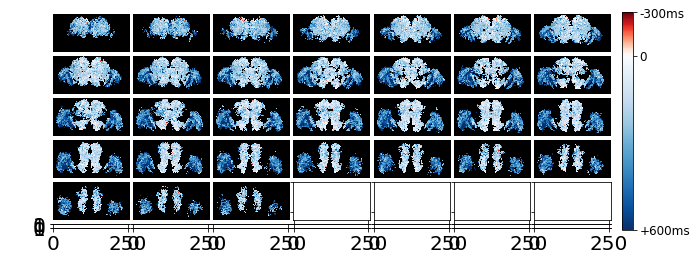

In [86]:
fig = plt.figure(figsize=(10,10))
grid = ImageGrid(fig, 111, nrows_ncols=(7, 7), axes_pad=.05)
for i in range(31):
    cax = grid[i].imshow(peak_time[i,:,:],cmap=mymap,vmin=end,vmax=start);
    grid[i].axis('off')

cbar = fig.colorbar(cax, ticks=[start, middle, end],shrink=.4, anchor=(1.3,.5))
cbar.ax.set_yticklabels(['-300ms', '0', '+600ms'], fontsize=12)
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
plt.savefig(fname,dpi=300,bbox_inches='tight')#

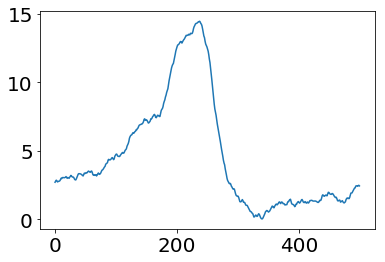

In [13]:
main_path = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20201221_neural_weighted_behavior/"

response_files = [os.path.join(main_path, file) for file in os.listdir(main_path) if 'responses' in file]
bbb.sort_nicely(response_files)

responses = []
for file in response_files:
    responses.append(np.load(file))
responses = np.asarray(responses)
responses.shape

responses_split = np.reshape(responses, (49,2000,3,500))
responses_fft = fft(responses_split,axis=-1)
responses_fft[:,:,:,15:23] = 0
responses_fft[:,:,:,475:485] = 0
responses_filtered = ifft(responses_fft,axis=-1)
responses_filtered.shape

cluster_id = np.argmax(np.sum(responses_filtered[20,:,0,:].real, axis=1))
plt.plot(responses_filtered[20,cluster_id,0,:])

In [17]:
cluster_id = np.argmax(np.sum(responses_filtered_old[20,:,0,:].real, axis=1))


In [14]:
responses_filtered_old = responses_filtered.copy()

In [16]:
responses_filtered_old.shape, responses_filtered.shape

((49, 2000, 3, 500), (31, 2000, 4, 500))

In [18]:
cluster_id

319

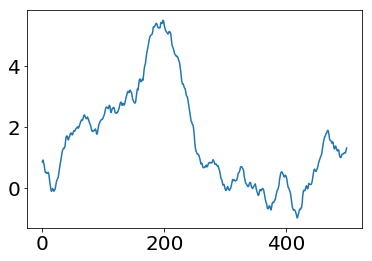

In [22]:
plt.plot(responses_filtered[20,cluster_id,0,:])

In [27]:
responses_filtered[11,:,0,:].dtype

dtype('complex128')

TypeError: Image data cannot be converted to float

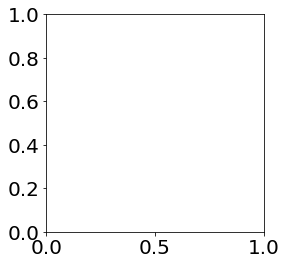

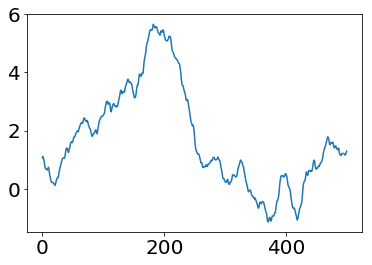

In [23]:
plt.plot(responses_filtered_old[20+9,cluster_id,0,:])

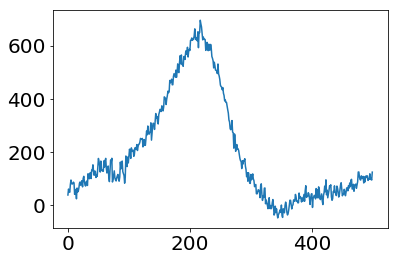

In [9]:
plt.plot(responses_filtered[20,cluster_id,3,:])

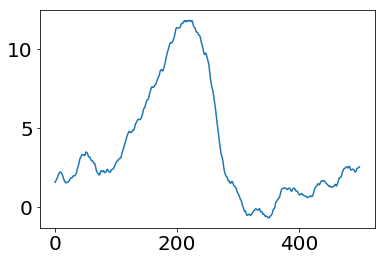

In [10]:
plt.plot(responses_filtered[20,cluster_id,0,:])

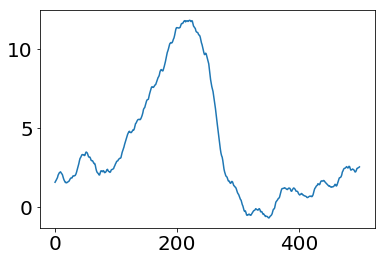

In [6]:
main_path = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20210316_neural_weighted_behavior/"

response_files = [os.path.join(main_path, file) for file in os.listdir(main_path) if 'responses' in file]
bbb.sort_nicely(response_files)

responses = []
for file in response_files:
    responses.append(np.load(file))
responses = np.asarray(responses)
responses.shape

responses_split = np.reshape(responses, (49-18,2000,4,500))
responses_fft = fft(responses_split,axis=-1)
responses_fft[:,:,:,15:23] = 0
responses_fft[:,:,:,475:485] = 0
responses_filtered = ifft(responses_fft,axis=-1)
responses_filtered.shape

cluster_id = np.argmax(np.sum(responses_filtered[20,:,0,:].real, axis=1))
plt.plot(responses_filtered[20,cluster_id,0,:])

In [9]:
responses_filtered.shape # z, cluster, behavior, time

(31, 2000, 4, 500)

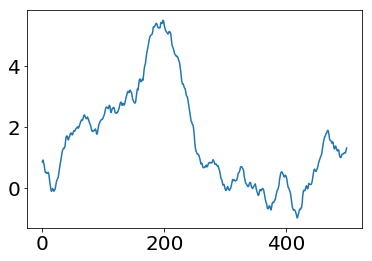

In [10]:
cluster_id = np.argmax(np.sum(responses_filtered[11,:,0,:].real, axis=1))
plt.plot(responses_filtered[20,cluster_id,0,:])

In [2]:
file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20210316_neural_weighted_behavior/master_X.npy"
X = np.load(file)

In [3]:
X.shape

(49, 9, 2000, 3384)

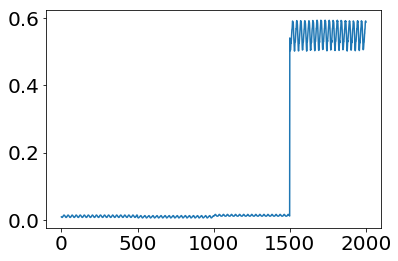

In [15]:
plt.plot(np.mean(X[20,0,:,:],axis=1))

(1500, 1600)

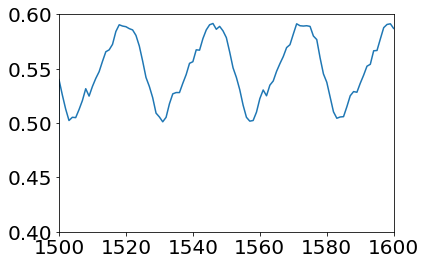

In [14]:
plt.plot(np.mean(X[20,0,:,:],axis=1))
plt.ylim(.4,.6)
plt.xlim(1500,1600)

(500, 600)

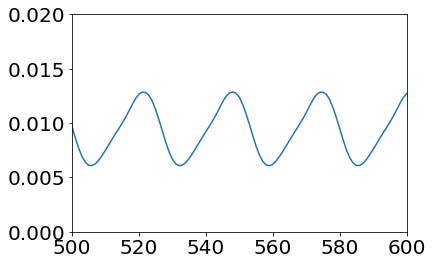

In [13]:
plt.plot(np.mean(X[20,0,:,:],axis=1))
plt.ylim(0,.02)
plt.xlim(500,600)

In [16]:
X_corrected = X - np.mean(X,axis=-1)[:,:,:,np.newaxis]

In [18]:
X_corrected.shape

(49, 9, 2000, 3384)

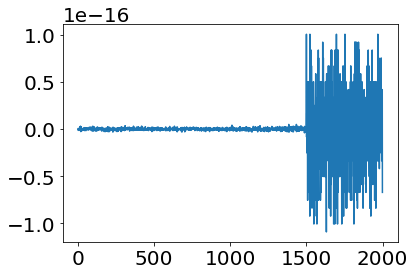

In [19]:
plt.plot(np.mean(X_corrected[20,0,:,:],axis=1))

In [17]:
save_file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20210316_neural_weighted_behavior/master_X_corrected.npy"
np.save(save_file, X_corrected)

In [24]:
file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20210316_neural_weighted_behavior/responses_20.npy"
cluster_responses = np.load(file)

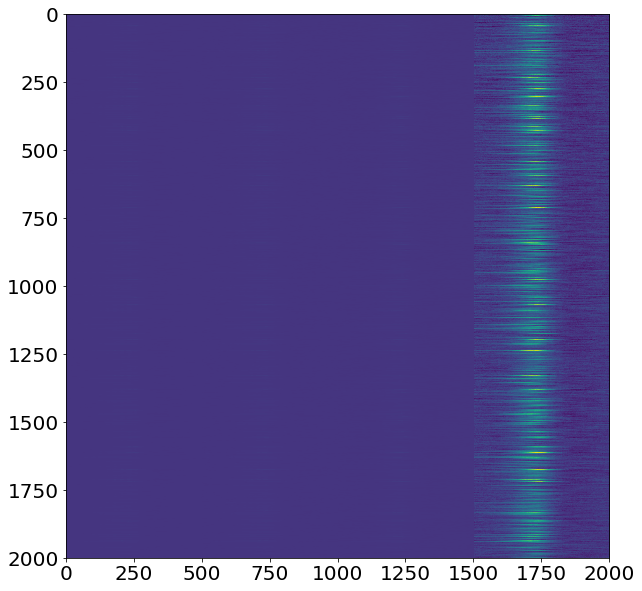

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(cluster_responses)

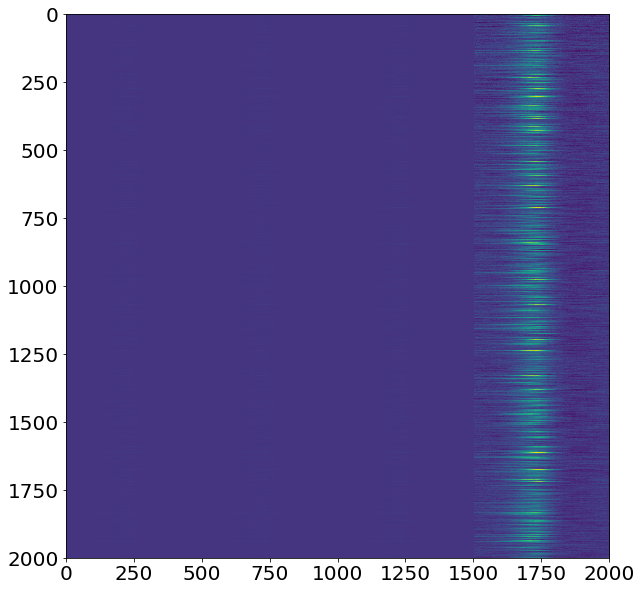

In [21]:
plt.figure(figsize=(10,10))
plt.imshow(cluster_responses)

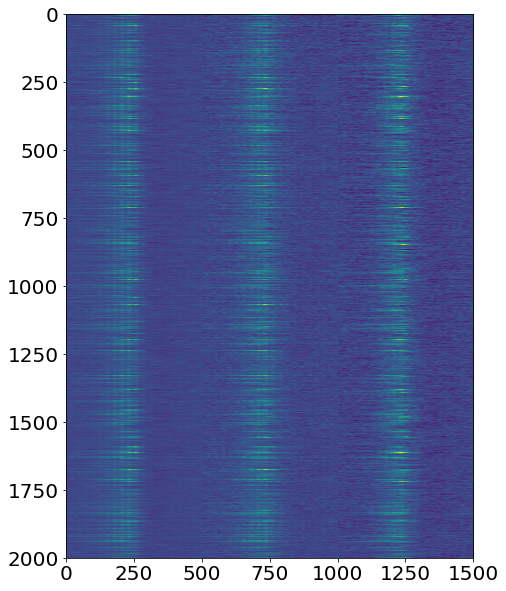

In [23]:
plt.figure(figsize=(10,10))
plt.imshow(cluster_responses[:,:1500])

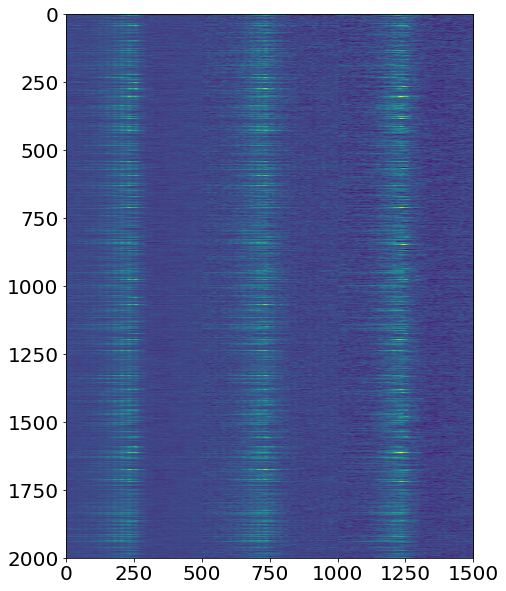

In [26]:
plt.figure(figsize=(10,10))
plt.imshow(cluster_responses[:,:1500])